# Fast front-prop

Fast front-prop implementation on matrices (see original `front-prop` idea in original notebook).
This one is ~100x faster, by parallelising all neurons in the layer.

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import math
import scipy
from scipy.spatial import distance
from sklearn.metrics import mean_squared_error
from sklearn import preprocessing
import torch
import torch.nn as nn
import torch.nn.functional as F
from tqdm.autonotebook import tqdm



C:\Users\karol\AppData\Local\Temp\ipykernel_7112\843985773.py:11: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


In [3]:
# If there's a GPU available...
if torch.cuda.is_available():  
    device = torch.device("cuda")  # you can continue going on here, like cuda:1 cuda:2....etc. 
    print("Running on the GPU")
else:
    device = torch.device("cpu")
    print("Running on the CPU")


Running on the GPU


In [4]:
np.set_printoptions(formatter={'float': lambda x: "{0:0.2f}".format(x)})


In [5]:
"""
Calculate discrete entropy for continuous values, by binning them.
Note this is Shannon's measure of information entropy.
Not cross-entropy loss, used commonly in training.

TODO: check if this is correct
"""
def entropy(numbers, range=(0, 1), bins=100):
    # h, bin_edges = np.histogram(numbers, bins=bins, density=False, range=range)
    # h = h / h.max() # normalise
    # entropy = scipy.stats.entropy(h)

    # Calculate histogram
    hist = torch.histc(numbers, bins=bins, min=range[0], max=range[1])
    # Normalize histogram
    hist /= hist.max()
    # Calculate entropy
    hist += torch.finfo(torch.float32).eps
    entropy = -(hist * torch.log2(hist)).sum()

    return entropy


In [6]:
import torch

def sphere_rnd_gen(n, d):
    """
    Generate n random points on a d-dimensional sphere.
    See https://math.stackexchange.com/questions/1585975/how-to-generate-random-points-on-a-sphere

    This is essential if we're normalising to unit length (ie projecting onto a hypersphere),
    because a uniform distribution from a unit cube won't be uniform on the sphere.
    """
    x = torch.randn(n, d)
    x /= torch.norm(x, dim=1, keepdim=True)
    return x

## Simple patterns

In [7]:
# Define input patterns

DIMS = [7,7]

patterns = [
    torch.tensor([
        [1,0,0,0,0,0,1],
        [0,1,0,0,0,1,0],
        [0,0,1,0,1,0,0],
        [0,0,0,1,0,0,0],
        [0,0,1,0,1,0,0],
        [0,1,0,0,0,1,0],
        [1,0,0,0,0,0,1]
    ]),
    torch.tensor([
        [0,0,0,1,0,0,0],
        [0,0,0,1,0,0,0],
        [0,0,0,1,0,0,0],
        [1,1,1,1,1,1,1],
        [0,0,0,1,0,0,0],
        [0,0,0,1,0,0,0],
        [0,0,0,1,0,0,0]
    ]),
    torch.tensor([
        [0,0,1,1,1,0,0],
        [0,1,0,0,0,1,0],
        [1,0,0,0,0,0,1],
        [1,0,0,0,0,0,1],
        [1,0,0,0,0,0,1],
        [0,1,0,0,0,1,0],
        [0,0,1,1,1,0,0]
    ]),
    torch.tensor([
        [0,1,0,0,0,0,0],
        [0,1,0,0,0,0,0],
        [0,1,0,0,0,0,0],
        [0,1,0,0,0,0,0],
        [0,1,0,0,0,0,0],
        [0,1,0,0,0,0,0],
        [0,1,0,0,0,0,0]
    ]),
    torch.tensor([
        [1,1,1,0,0,0,0],
        [1,1,1,0,0,0,0],
        [1,1,1,0,0,0,0],
        [0,0,0,0,0,0,0],
        [0,0,0,0,0,0,0],
        [0,0,0,0,0,0,0],
        [0,0,0,0,0,0,0]
    ])
# np.array([
# [0,1,1,0],
# [1,0,0,1],
# [1,0,0,1],
# [0,1,1,0]
# ])
]

# Define probabilities

probs = np.full(len(patterns), 1) # np.array([0.43 0.43 0.13])
probs = probs / probs.sum()



In [8]:
# plot the 2D matrix heatmap
# supports a 2D array, or flattened (uses DIMS to restore 1D to 2D)
def plot_matrix(dims, *datas):
    PLOTS_PER_ROW = 20
    cols = min(len(datas), PLOTS_PER_ROW)
    rows = math.ceil(len(datas)/PLOTS_PER_ROW)
    fig = plt.figure(figsize=(cols,rows))
    for i, data in enumerate(datas):
        data = data.cpu().numpy()
        if data.shape != dims:
            data = np.reshape(data, dims)
        fig.add_subplot(rows, cols, i+1)
        plt.imshow(data, cmap='gray')
        plt.axis('off')
        # plt.title(f"#{i}")
    plt.show()


----------------
Running frontprop on following patterns:


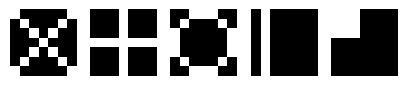

with probabilities:
[0.20 0.20 0.20 0.20 0.20]



 --- Iter #0 --- 


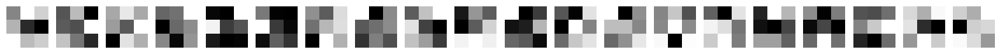

Layer outputs:
tensor([[[[0.0000, 1.7771, 1.1007, 0.0000, 0.0000],
          [2.4370, 0.0000, 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000, 0.0000, 0.0000],
          [0.0000, 1.1799, 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 1.9078, 0.0000, 0.0000]],

         [[0.0000, 0.0000, 0.0000, 4.2561, 0.0000],
          [3.2766, 0.0000, 0.0000, 0.0000, 3.4938],
          [1.6177, 0.0000, 0.0000, 0.0000, 0.0000],
          [0.0000, 1.6536, 0.0000, 0.0000, 1.6800],
          [0.0000, 0.0000, 1.2789, 4.8059, 0.0000]],

         [[0.0000, 2.1960, 2.2797, 3.0006, 1.1467],
          [0.0000, 0.0000, 0.0000, 0.0000, 3.0615],
          [0.0000, 0.0000, 0.0000, 0.0000, 2.5267],
          [2.1303, 0.0000, 0.0000, 0.0000, 2.9653],
          [1.1467, 2.1913, 0.0000, 1.5699, 0.0000]],

         [[2.2861, 0.0000, 1.9091, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000, 2.1805, 0.0000],
          [0.0000, 0.0000, 0.0000, 0.0000, 3.1623],
          [0.0000, 0.0000, 0.0000, 0.0000, 

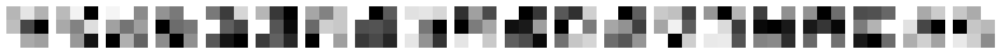

Layer outputs:
tensor([[[[2.1444, 1.8548, 1.1653, 0.0000, 0.0000],
          [1.0634, 0.0000, 0.0000, 0.0000, 0.0000],
          [1.0370, 0.7366, 0.2853, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000, 0.0000, 0.0000]],

         [[2.7332, 2.1545, 1.1383, 0.0000, 0.0000],
          [1.8547, 1.3716, 0.0000, 0.0000, 0.0000],
          [0.0000, 0.7868, 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000, 0.0000, 0.0000]],

         [[2.9025, 1.9855, 0.0000, 0.0000, 0.0000],
          [2.1276, 1.4809, 0.0000, 0.0000, 0.0000],
          [1.1789, 0.0000, 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000, 0.0000, 0.0000]],

         [[2.1234, 0.0000, 0.5023, 0.0000, 0.0000],
          [1.5963, 0.0000, 0.0000, 0.0000, 0.0000],
          [1.2585, 0.0000, 0.3199, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000, 0.0000, 

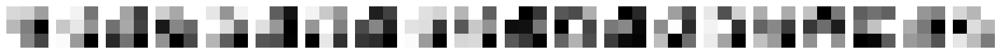

Layer outputs:
tensor([[[[0.0000, 0.0000, 0.0000, 0.0000, 1.0346],
          [0.0000, 0.9187, 0.8476, 1.0346, 0.0000],
          [0.0000, 0.8751, 1.6732, 1.0763, 0.8211],
          [0.0000, 1.0346, 0.9268, 0.9187, 0.0000],
          [1.0346, 0.0000, 0.0000, 0.0000, 0.0000]],

         [[0.0000, 0.0000, 0.0000, 0.0000, 1.0020],
          [0.0000, 0.9517, 0.9814, 1.0020, 0.0000],
          [0.0000, 1.0102, 1.6071, 1.0444, 0.0000],
          [0.0000, 1.0020, 1.0397, 0.9517, 0.0000],
          [1.0020, 0.0000, 0.0000, 0.0000, 0.0000]],

         [[1.0124, 0.0000, 0.0000, 0.0000, 0.0000],
          [0.0000, 1.0124, 0.9922, 0.9577, 0.0000],
          [0.0000, 1.0174, 1.6272, 1.0419, 0.0000],
          [0.0000, 0.9577, 1.0170, 1.0124, 0.0000],
          [0.0000, 0.0000, 0.0000, 0.0000, 1.0124]],

         [[0.0000, 0.0000, 0.0000, 0.0000, 1.0873],
          [0.0000, 1.0120, 0.8004, 1.0873, 0.0000],
          [0.0000, 0.9161, 1.7813, 0.8522, 0.0000],
          [0.0000, 1.0873, 0.9362, 1.0120, 

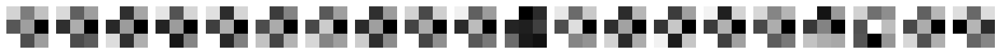

Layer outputs:
tensor([[[[1.0331, 0.6049, 0.7353, 0.5479, 1.0874],
          [0.5785, 1.0331, 0.0000, 1.0874, 0.6356],
          [0.6957, 0.0000, 1.7931, 0.0000, 0.7700],
          [0.5479, 1.0874, 0.0000, 1.0331, 0.6049],
          [1.0874, 0.6356, 0.7304, 0.5785, 1.0331]],

         [[1.0257, 0.6190, 0.7034, 0.5960, 1.0764],
          [0.6052, 1.0257, 0.0000, 1.0764, 0.6282],
          [0.6536, 0.0000, 1.7608, 0.0000, 0.7658],
          [0.5960, 1.0764, 0.0000, 1.0257, 0.6190],
          [1.0764, 0.6282, 0.7160, 0.6052, 1.0257]],

         [[1.0785, 0.6011, 0.7273, 0.5795, 1.0570],
          [0.5787, 1.0785, 0.0000, 1.0570, 0.6003],
          [0.7001, 0.0000, 1.8019, 0.0000, 0.7682],
          [0.5795, 1.0570, 0.0000, 1.0785, 0.6011],
          [1.0570, 0.6003, 0.7411, 0.5787, 1.0785]],

         [[1.0436, 0.5738, 0.7250, 0.5556, 1.1017],
          [0.5891, 1.0436, 0.0000, 1.1017, 0.6072],
          [0.7025, 0.0000, 1.8128, 0.0000, 0.7778],
          [0.5556, 1.1017, 0.0000, 1.0436, 

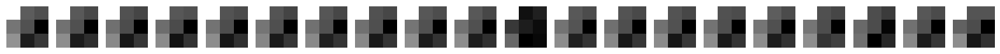

Layer outputs:
tensor([[[[2.9371, 2.0934, 1.2039, 0.0000, 0.0000],
          [1.9904, 1.4435, 0.8160, 0.0000, 0.0000],
          [0.0000, 0.7933, 0.4767, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000, 0.0000, 0.0000]],

         [[2.9400, 2.0980, 1.2006, 0.0000, 0.0000],
          [1.9980, 1.4470, 0.8156, 0.0000, 0.0000],
          [0.0000, 0.7935, 0.4765, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000, 0.0000, 0.0000]],

         [[2.9397, 2.0879, 1.2003, 0.0000, 0.0000],
          [1.9931, 1.4422, 0.8179, 0.0000, 0.0000],
          [0.0000, 0.7910, 0.4791, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000, 0.0000, 0.0000]],

         [[2.9383, 2.0803, 1.1973, 0.0000, 0.0000],
          [2.0006, 1.4395, 0.8127, 0.0000, 0.0000],
          [0.0000, 0.7944, 0.4780, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000, 0.0000, 

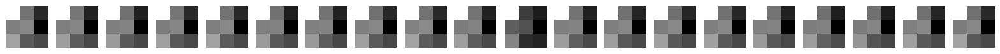

Layer outputs:
tensor([[[[0.9772, 0.0000, 1.0426, 1.0168, 1.0894],
          [1.0589, 0.0000, 0.0000, 0.2549, 0.8509],
          [1.1708, 0.0000, 0.0000, 0.0000, 0.7680],
          [1.1187, 0.0000, 0.0000, 0.2839, 0.7986],
          [1.0894, 0.0000, 0.9652, 0.9104, 0.9772]],

         [[0.9703, 0.0000, 1.0401, 1.0201, 1.0866],
          [1.0588, 0.0000, 0.0000, 0.2522, 0.8573],
          [1.1660, 0.0000, 0.0000, 0.0000, 0.7691],
          [1.1209, 0.0000, 0.0000, 0.2848, 0.8031],
          [1.0866, 0.0000, 0.9677, 0.9149, 0.9703]],

         [[0.9664, 0.0000, 1.0377, 1.0214, 1.0892],
          [1.0575, 0.0000, 0.0000, 0.2497, 0.8571],
          [1.1693, 0.0000, 0.0000, 0.0000, 0.7686],
          [1.1241, 0.0000, 0.0000, 0.2855, 0.8008],
          [1.0892, 0.0000, 0.9661, 0.9140, 0.9664]],

         [[0.9766, 0.0000, 1.0443, 1.0199, 1.0871],
          [1.0584, 0.0000, 0.0000, 0.2565, 0.8561],
          [1.1664, 0.0000, 0.0000, 0.0000, 0.7727],
          [1.1164, 0.0000, 0.0000, 0.2841, 

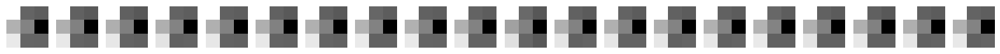

Layer outputs:
tensor([[[[0.0000, 1.1855, 0.0000, 0.0000, 0.0000],
          [0.9207, 1.1855, 0.0000, 0.0000, 0.0000],
          [0.9207, 1.1855, 0.0000, 0.0000, 0.0000],
          [0.9207, 1.1855, 0.0000, 0.0000, 0.0000],
          [0.0000, 1.1855, 0.0000, 0.0000, 0.0000]],

         [[0.0000, 1.1832, 0.0000, 0.0000, 0.0000],
          [0.9219, 1.1832, 0.0000, 0.0000, 0.0000],
          [0.9219, 1.1832, 0.0000, 0.0000, 0.0000],
          [0.9219, 1.1832, 0.0000, 0.0000, 0.0000],
          [0.0000, 1.1832, 0.0000, 0.0000, 0.0000]],

         [[0.0000, 1.1857, 0.0000, 0.0000, 0.0000],
          [0.9205, 1.1857, 0.0000, 0.0000, 0.0000],
          [0.9205, 1.1857, 0.0000, 0.0000, 0.0000],
          [0.9205, 1.1857, 0.0000, 0.0000, 0.0000],
          [0.0000, 1.1857, 0.0000, 0.0000, 0.0000]],

         [[0.0000, 1.1810, 0.0000, 0.0000, 0.0000],
          [0.9222, 1.1810, 0.0000, 0.0000, 0.0000],
          [0.9222, 1.1810, 0.0000, 0.0000, 0.0000],
          [0.9222, 1.1810, 0.0000, 0.0000, 

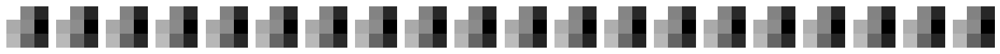

Layer outputs:
tensor([[[[2.9346, 2.2043, 1.2127, 0.0000, 0.0000],
          [1.9553, 1.4888, 0.0000, 0.0000, 0.0000],
          [1.0185, 0.7686, 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000, 0.0000, 0.0000]],

         [[2.9347, 2.2047, 1.2112, 0.0000, 0.0000],
          [1.9548, 1.4892, 0.0000, 0.0000, 0.0000],
          [1.0182, 0.7692, 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000, 0.0000, 0.0000]],

         [[2.9344, 2.2047, 1.2131, 0.0000, 0.0000],
          [1.9571, 1.4899, 0.0000, 0.0000, 0.0000],
          [1.0199, 0.7710, 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000, 0.0000, 0.0000]],

         [[2.9349, 2.2063, 1.2134, 0.0000, 0.0000],
          [1.9585, 1.4885, 0.0000, 0.0000, 0.0000],
          [1.0224, 0.7696, 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000, 0.0000, 

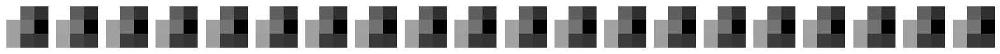

Layer outputs:
tensor([[[[1.0769, 0.6604, 0.6448, 0.4809, 0.9746],
          [0.5219, 1.0769, 0.8657, 0.9746, 0.7014],
          [0.5183, 0.0000, 1.7248, 0.9770, 0.8797],
          [0.0000, 0.0000, 0.9067, 1.0769, 0.6604],
          [0.9746, 0.0000, 0.7532, 0.5219, 1.0769]],

         [[1.0756, 0.6715, 0.6506, 0.4910, 0.9714],
          [0.5187, 1.0756, 0.8786, 0.9714, 0.6991],
          [0.5149, 0.0000, 1.7195, 0.9829, 0.8771],
          [0.0000, 0.0000, 0.9062, 1.0756, 0.6715],
          [0.9714, 0.0000, 0.7414, 0.5187, 1.0756]],

         [[1.0771, 0.6608, 0.6441, 0.4822, 0.9741],
          [0.5222, 1.0771, 0.8665, 0.9741, 0.7008],
          [0.5167, 0.0000, 1.7239, 0.9773, 0.8800],
          [0.0000, 0.0000, 0.9064, 1.0771, 0.6608],
          [0.9741, 0.0000, 0.7526, 0.5222, 1.0771]],

         [[1.0727, 0.6633, 0.6448, 0.4819, 0.9713],
          [0.5252, 1.0727, 0.8704, 0.9713, 0.7065],
          [0.5152, 0.0000, 1.7188, 0.9812, 0.8784],
          [0.0000, 0.0000, 0.9137, 1.0727, 

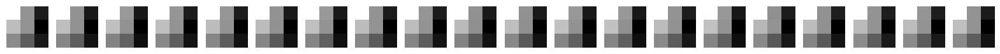

Layer outputs:
tensor([[[[0.9967, 1.1810, 0.0000, 0.0000, 0.0000],
          [0.9967, 1.1810, 0.0000, 0.0000, 0.0000],
          [0.9967, 1.1810, 0.0000, 0.0000, 0.0000],
          [0.9967, 1.1810, 0.0000, 0.0000, 0.0000],
          [0.9967, 1.1810, 0.0000, 0.0000, 0.0000]],

         [[0.9969, 1.1803, 0.0000, 0.0000, 0.0000],
          [0.9969, 1.1803, 0.0000, 0.0000, 0.0000],
          [0.9969, 1.1803, 0.0000, 0.0000, 0.0000],
          [0.9969, 1.1803, 0.0000, 0.0000, 0.0000],
          [0.9969, 1.1803, 0.0000, 0.0000, 0.0000]],

         [[1.0061, 1.1819, 0.0000, 0.0000, 0.0000],
          [1.0061, 1.1819, 0.0000, 0.0000, 0.0000],
          [1.0061, 1.1819, 0.0000, 0.0000, 0.0000],
          [1.0061, 1.1819, 0.0000, 0.0000, 0.0000],
          [1.0061, 1.1819, 0.0000, 0.0000, 0.0000]],

         [[0.9975, 1.1856, 0.0000, 0.0000, 0.0000],
          [0.9975, 1.1856, 0.0000, 0.0000, 0.0000],
          [0.9975, 1.1856, 0.0000, 0.0000, 0.0000],
          [0.9975, 1.1856, 0.0000, 0.0000, 

In [16]:
import fp_modules as fp

ITERS = 200 # 10000
NEURONS = 20 # 500
DRAW_INTERVAL = 20 # 500
VERBOSE=False
kernel_size = (3,3)

layer = fp.FpConv2d(1, NEURONS, kernel_size, device=device, t_decay=0.0005, w_boost=0.01)

print("\n----------------\nRunning frontprop on following patterns:")
plot_matrix(DIMS, *patterns)
print(f"with probabilities:\n{probs}\n\n")

# FIXME
patterns = [p.float().to(device) for p in patterns]

for i in range(ITERS):

    input_idx = np.random.choice(len(probs), p=probs)

    # add batch dim and channel dim
    input = patterns[input_idx].unsqueeze(0).unsqueeze(0)

    if VERBOSE:
        print(f"Iter #{i}: Feeding input pattern #{input_idx}")
        print(input)
        plot_matrix(input)
        
    out = layer.forward(input)
    
    if i % DRAW_INTERVAL == 0:
        print(f"\n --- Iter #{i} --- ")
        plot_matrix(kernel_size, *([layer.weight[i] for i in range(NEURONS)]))
        print("Layer outputs:")
        print(out)
        


## MNIST

In [17]:
import torchvision
import torchvision.datasets as datasets

mnist_trainset = datasets.FashionMNIST(root='./data', train=True, download=True, transform=None)
mnist_train = mnist_trainset.data.to(device) # .cpu().detach().numpy()
mnist_train_labels = mnist_trainset.targets.to(device) # .cpu().detach().numpy()

mnist_testset = datasets.FashionMNIST(root='./data', train=False, download=True, transform=None)
mnist_test = mnist_testset.data.to(device) # .cpu().detach().numpy()
mnist_test_labels = mnist_testset.targets.to(device) # .cpu().detach().numpy()

# normalise to 0-1
mnist_train = mnist_train / 256.0
mnist_test = mnist_test / 256.0

(mnist_train.shape, mnist_train_labels.shape, mnist_test.shape, mnist_test_labels.shape)

(torch.Size([60000, 28, 28]),
 torch.Size([60000]),
 torch.Size([10000, 28, 28]),
 torch.Size([10000]))


----------------
Running frontprop on MNIST

 === Epoch #0 === 


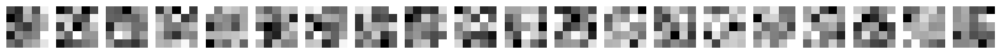

  0%|          | 0/60000 [00:00<?, ?it/s]

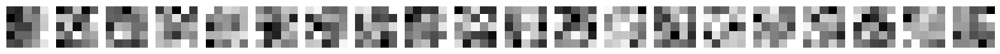

KeyboardInterrupt: 

In [18]:
EPOCHS = 1
NEURONS = 20
THRESHOLD_DECAY=0.001
WEIGHT_BOOST=0.01

DIMS = [28, 28]
STATS_INTERVAL = 10000

kernel_size = (5,5)
layer1 = fp.FpConv2d(1, NEURONS, kernel_size, device=device, t_decay=THRESHOLD_DECAY, w_boost=WEIGHT_BOOST)

print("\n----------------\nRunning frontprop on MNIST")

for epoch in range(EPOCHS):
    
    print(f"\n === Epoch #{epoch} === ")
    
    plot_matrix(kernel_size, *([layer1.weight[i] for i in range(NEURONS)]))
    
    indices = np.arange(mnist_train.shape[0])
    np.random.shuffle(indices)
    
    for i, input_idx in enumerate(tqdm(indices)):

        # add batch dim and channel dim
        input1 = mnist_train[input_idx].unsqueeze(0).unsqueeze(0)

        out1 = layer1.forward(input1)

        if i % STATS_INTERVAL == 0:
            plot_matrix(kernel_size, *([layer1.weight[i] for i in range(NEURONS)]))


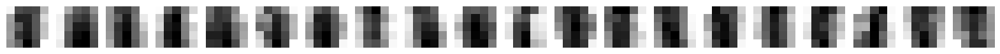

In [19]:
plot_matrix(kernel_size, *([layer1.weight[i] for i in range(NEURONS)]))

## TEST

Test the "goodness" of embeddings on the unseen MNIST test dataset.

### Compute embeddings (network outputs)

In [44]:
# first collect outputs for MNIST test samples

def compute_embeddings(layer, data):
    layer.freeze(verbose=False)
    embeddings = [layer.forward(sample.flatten()) for sample in data]
    embeddings = torch.stack(embeddings)
    layer.unfreeze(verbose=False)
    return embeddings
    
def standard_scale(data):
    # standard scaling (0 mean, 1 variance) before we feed into PCA or LogReg
    mean = torch.mean(data)
    std = torch.std(data)
    return (data - mean) / std


In [45]:
mnist_train_embeddings = standard_scale(compute_embeddings(layer1, mnist_train))
print(mnist_train_embeddings.shape)
      
mnist_test_embeddings = standard_scale(compute_embeddings(layer1, mnist_test))
print(mnist_test_embeddings.shape)


torch.Size([60000, 500])
torch.Size([10000, 500])


### PCA

Use PCA to visualise whether the network outputs cluster well.

In [46]:
def show_pca(data, labels, alpha=0.3, s=15):
    from sklearn.decomposition import PCA

    data = data.cpu().detach().numpy()
    labels = labels.cpu().detach().numpy()

    pca = PCA(n_components=2)
    pca_features = pca.fit_transform(data)
    # plot:
    plt.figure(figsize=(15,10))
    plt.scatter(pca_features[:, 0], pca_features[:, 1],
                c=labels, edgecolor='none', alpha=alpha,
                cmap=plt.cm.get_cmap('tab10', 10), s=s)
    plt.colorbar();
    plt.show()

C:\Users\karol\AppData\Local\Temp\ipykernel_16584\815907363.py:13: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap=plt.cm.get_cmap('tab10', 10), s=s)


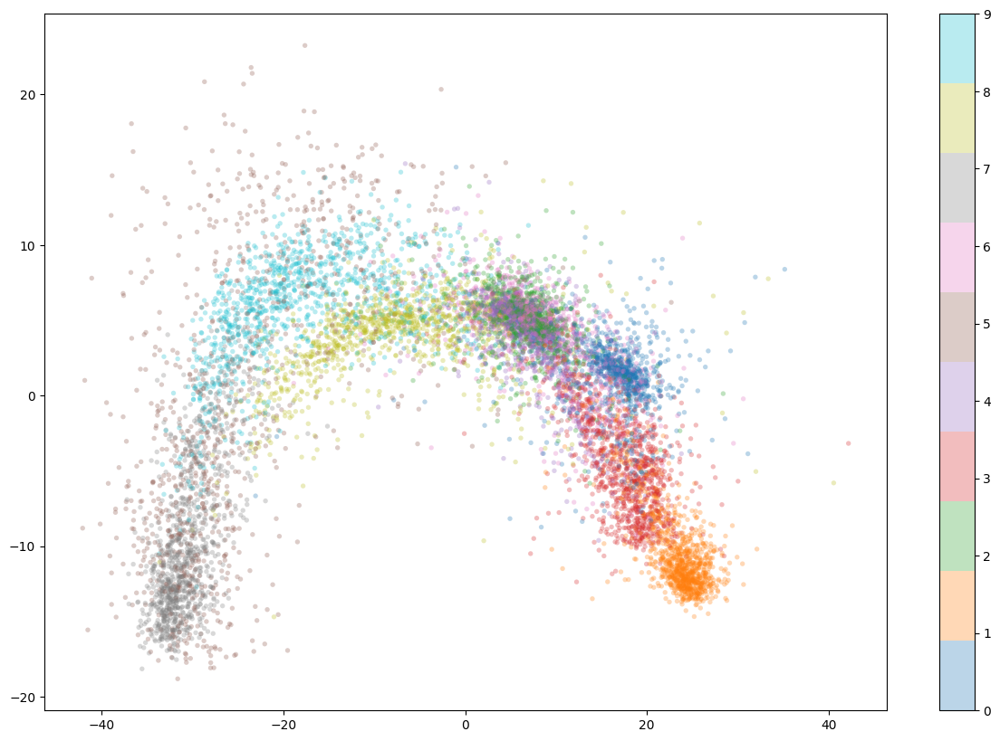

In [47]:
show_pca(mnist_test_embeddings, mnist_test_labels)

## KNN
TODO:
Cluster outputs using KNN, similarly to PCA above.


### Log Reg

This is similar to the benchmark used in Geoffrey Hinton's paper ("forward-forward", see [here](https://www.cs.toronto.edu/~hinton/FFA13.pdf)).
Use outputs as embeddings and train a simple multi-class Log Reg (aka Softmax) on them.

Results can then be compared with other self-supervised networks, incl the "forward-forward" above.

In [48]:
def logReg_score(train_data, train_labels, test_data, test_labels, max_iter=10000, verbose=0):
    from sklearn.linear_model import LogisticRegression, LogisticRegressionCV

    train_data = train_data.cpu().detach().numpy()
    train_labels = train_labels.cpu().detach().numpy()
    test_data = test_data.cpu().detach().numpy()
    test_labels = test_labels.cpu().detach().numpy()

    # TODO: find optimal hyper params - try out different solvers etc
    # TODO: try LogisticRegressionCV
    logReg = LogisticRegression(verbose=verbose, solver = 'lbfgs', multi_class="multinomial", max_iter=max_iter, n_jobs = -1)
    logReg.fit(train_data, train_labels)
    score = logReg.score(test_data, test_labels)
    return score


In [49]:
score = logReg_score(mnist_train_embeddings, mnist_train_labels, mnist_test_embeddings, mnist_test_labels)
score

0.6958

In [50]:
print(score)

0.6958


In [ ]:
layer1.save(f"mnist_{layer1.output_size}n_{EPOCHS}ep_{layer1.w_boost}wb_{layer1.t_decay}td_{round(score,4)}score")

# Best score: 0.9614   👀  

# (╯°□°)╯︵ ┻━┻

## Scoreboard

1. `0.9655` - 2000/100/500 neurons, 1 epoch, td = 0.0001, wb = 0.01 (vs untrained `?`)
1. `0.9614` - 2000 neurons, 1 epoch, td = 0.0001, wb = 0.01 (vs untrained `?`)
1. `0.9553` - 2000 neurons, 3 epochs, td = 0.0001, wb = 0.01 (vs untrained `?`)
1. `0.9540` - 1000 neurons, 1 epoch, td = 0.0001, wb = 0.01 (vs untrained `0.9469`)
1. `0.9494` - 500  neurons, 1 epoch, td = 0.0001, wb = 0.01 (vs untrained `0.9314`)
1. `0.9318` - 200  neurons, 1 epoch, td = 0.0001, wb = 0.01 (vs untrained `0.9167`)
1. `0.9166` - 100  neurons, 1 epoch, td = 0.0001, wb = 0.01 (vs untrained `0.8927`)
1. `0.7898` - 20   neurons, 1 epoch, td = 0.0001, wb = 0.01 (vs untrained `0.6694`)

## Baselines
Compare the above accuracy with some baselines to relate the performance.
Proposed baselines:
1. An untrained network with randomly initialised weights (kernels). This tests whether training the network improves accuracy.
1. Raw MNIST data, without the network. This tests whether the network generated representation is better than the original features (ie whether the network learned any useful representation of patterns in the data).

### Random weights

Freezing all 500 neurons
Neurons' weights:


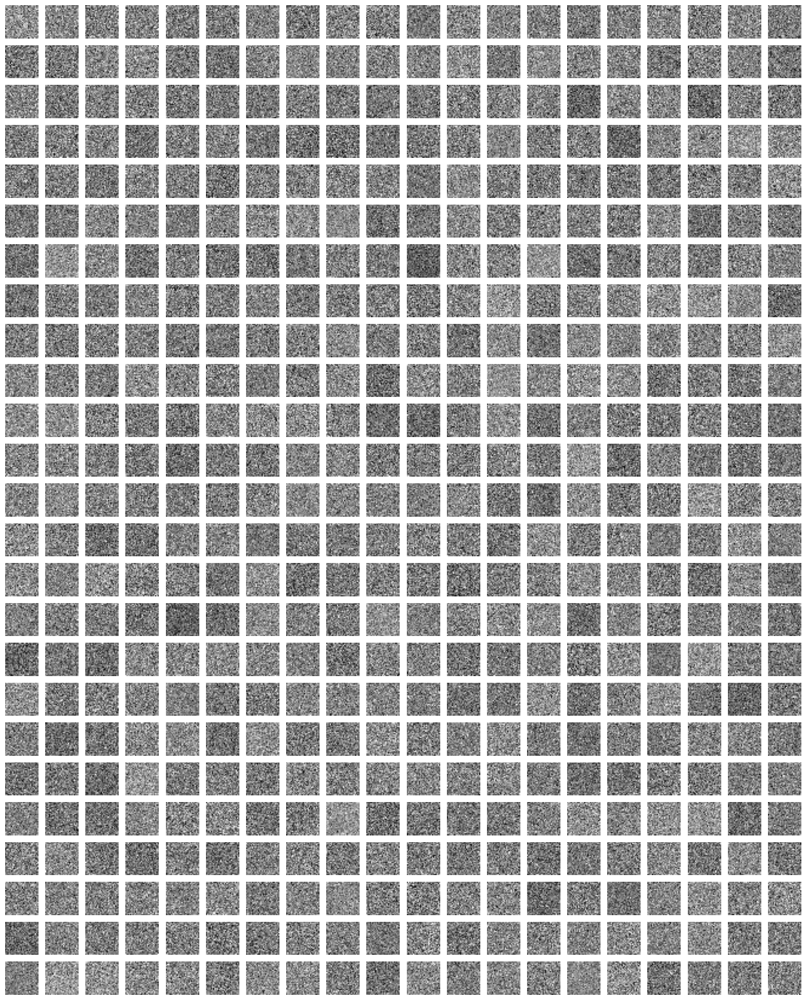

In [51]:
# first collect outputs for all MNIST samples

untrained_layer = FastLayer(device, DIMS[0]*DIMS[1], NEURONS)
untrained_layer.freeze()
untrained_layer.draw(DIMS)

untrained_embeddings = standard_scale(compute_embeddings(untrained_layer, mnist_train))
untrained_test_embeddings = standard_scale(compute_embeddings(untrained_layer, mnist_test))


In [52]:
untrained_logReg = logReg_score(untrained_embeddings, mnist_train_labels, 
                                untrained_test_embeddings, mnist_test_labels)
untrained_logReg

0.8434

In [53]:
print(untrained_logReg)

0.8434


### Only LogReg
Plain Log Reg, without the network, directly on MNIST features.
Typical accuracy ~0.92-0.93

In [54]:
# flatten 2D images to continous vectors
mnist_train_1d = torch.reshape(mnist_train, shape=(mnist_train.shape[0], mnist_train.shape[1]**2))
mnist_test_1d = torch.reshape(mnist_test, shape=(mnist_test.shape[0], mnist_test.shape[1]**2))

# standard preprocessing (0 mean, 1 variance) before we feed into LogReg 
mnist_train_scaled = standard_scale(mnist_train_1d)
mnist_test_scaled = standard_scale(mnist_test_1d)


In [55]:
raw_logreg_score = logReg_score(mnist_train_1d, mnist_train_labels,
                                mnist_test_1d, mnist_test_labels)
raw_logreg_score

0.8437

In [39]:
print(raw_logreg_score)

0.8437




---




---


In [ ]:
# TODO
# see if normalising output by distance is better than normalising by max
# CHERRY PICK top 10 highest activated neurons per digit 
#     and create a synthetic layer and benchmark it against random 100
# compute score every X iterations and add to stats (need train/val split)
# benchmark each layer separately, plus LogReg on ALL outputs combined.
# HP search
# repulsion mechanism - Lateral Inhibition
# mini-batch
# torch impl

## Weights analysis

Highest activating neurons for digit 0
Neurons indices: [1690  822  484   29  151 1061  661 1476  502 1642 1029  964 1264 1315
 1421  517 1548  792  960  344 1488  689  638  605 1533 1719  280  254
  943  558  672 1445  766  616  947  319  181 1568   55 1513]


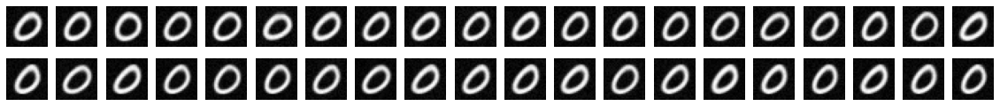

Highest activating neurons for digit 1
Neurons indices: [ 317   90 1502 1397 1830  679  875  346 1051 1960  599  538  450 1720
  505 1864  423  284  727 1366 1527 1015  510   23 1082 1102 1100 1149
 1128 1931 1301  192 1686 1841  805  735 1269 1059  573 1304]


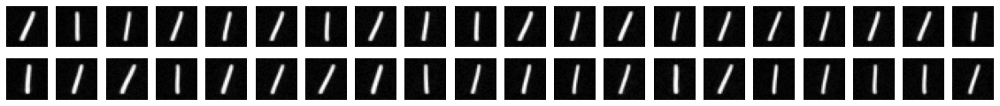

Highest activating neurons for digit 2
Neurons indices: [ 796 1890  342 1915  132  349   86  842 1305  775 1622  717  893 1492
  177  805  346  599 1590  175 1100 1631  995  510  300  450 1186    5
 1968  679  317 1329  487  727 1063  513 1792 1485 1443  702]


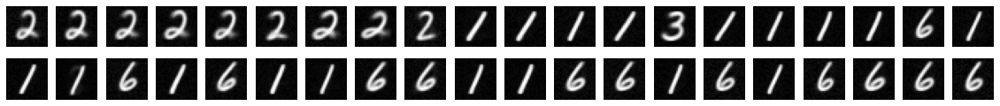

Highest activating neurons for digit 3
Neurons indices: [ 677  733  798 1559  930 1620  102  897 1638  922  231 1414  119 1641
 1279  297 1097 1677 1576 1758  171 1444  303 1785   10 1160  670  129
 1202 1333 1764 1578  630  900 1320  917 1971 1816 1398 1019]


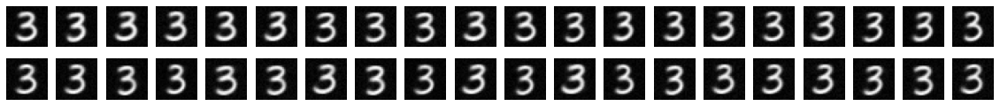

Highest activating neurons for digit 4
Neurons indices: [ 926  258  498  699  666  219   98  944 1109 1092  732 1836  278 1370
    2  660  206  222 1289 1957  784 1183 1278 1312  410 1615 1018 1072
  594  872  295  437 1627  146  454  938 1523 1368  966  308]


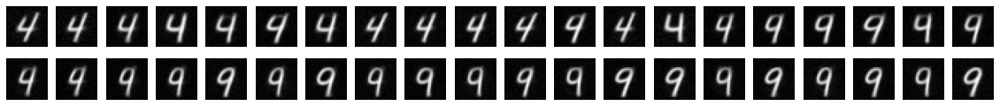

Highest activating neurons for digit 5
Neurons indices: [ 624 1575  585  987  771  950   64 1017   95 1965 1258  366   47 1086
 1223 1680 1623 1449 1410  721  550 1144 1454 1947 1662 1360  989  543
  277  256 1420  684 1930 1573 1946 1800 1713 1833 1583  941]


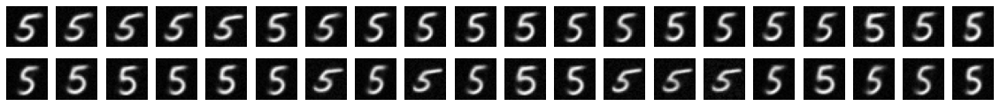

Highest activating neurons for digit 6
Neurons indices: [  72 1640   59 1290 1016 1619 1022 1787 1169 1211  229 1695  242   80
  547  755  448 1666 1811 1491 1613 1650  266 1498  221 1009 1340  407
  763  786 1228  835  417 1039  544 1954 1448 1023 1440 1878]


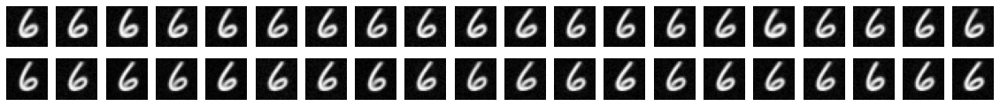

Highest activating neurons for digit 7
Neurons indices: [ 120  830  272 1457 1347 1139 1743  310  675 1903 1291 1571  744  406
 1718 1307  714 1084 1600 1685  390  305   68 1005 1045  136  332  991
 1487 1490  894  333   44  248  898 1584 1994 1026  549 1215]


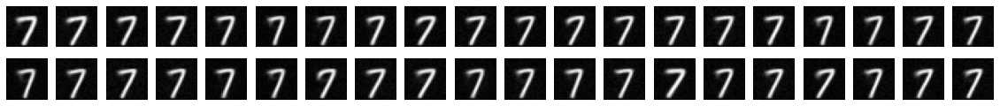

Highest activating neurons for digit 8
Neurons indices: [ 144 1170  292   36  825  706  868  752 1310  531 1976  118 1858  470
 1296  155  645 1510    7  614  563  951 1369 1504  282   33 1411  753
 1233 1464 1121 1611  725 1806  299 1185 1828 1592  659  957]


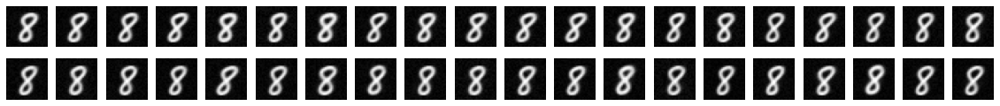

Highest activating neurons for digit 9
Neurons indices: [ 432 1530  770  802  474 1495  135 1629   71  739 1201  141  439 1323
 1255  162 1804  882 1353 1986   81 1996  819  409 1141  994 1704  108
 1088  671 1753 1243  988   82 1609 1365 1213  370  477 1594]


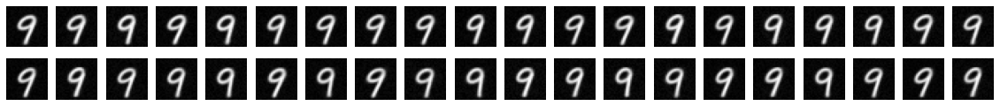

In [405]:

N = 40
topN_kernels_for_digit = []

for digit in range(10):
    print(f"Highest activating neurons for digit {digit}")
    
    digit_indices = (mnist_train_labels == digit).nonzero()[0]
    digit_outputs = mnist_train_embeddings[digit_indices]
    digit_outputs_sum = np.sum(digit_outputs, axis = 0)
    # get indices of top N neurons with highest sums
    # https://stackoverflow.com/questions/6910641/how-do-i-get-indices-of-n-maximum-values-in-a-numpy-array
    topN_neurons_indices = np.argpartition(digit_outputs_sum, -N)[-N:]
    topN_neurons_indices = topN_neurons_indices[np.argsort(digit_outputs_sum[topN_neurons_indices])]
    topN_neurons_indices = np.flip(topN_neurons_indices)
    # save them
    topN_kernels_for_digit.append(layer1.W[topN_neurons_indices])
    # draw them
    print(f"Neurons indices: {topN_neurons_indices}")
    plot_matrix(DIMS, *([w for w in layer1.W[topN_neurons_indices]]))
    
    
topN_kernels_for_digit = np.array(topN_kernels_for_digit)

In [408]:
topN_kernels_for_digit.shape

(10, 40, 784)

In [413]:
topN_kernels_for_digit.reshape(10*40, 784).shape

(400, 784)

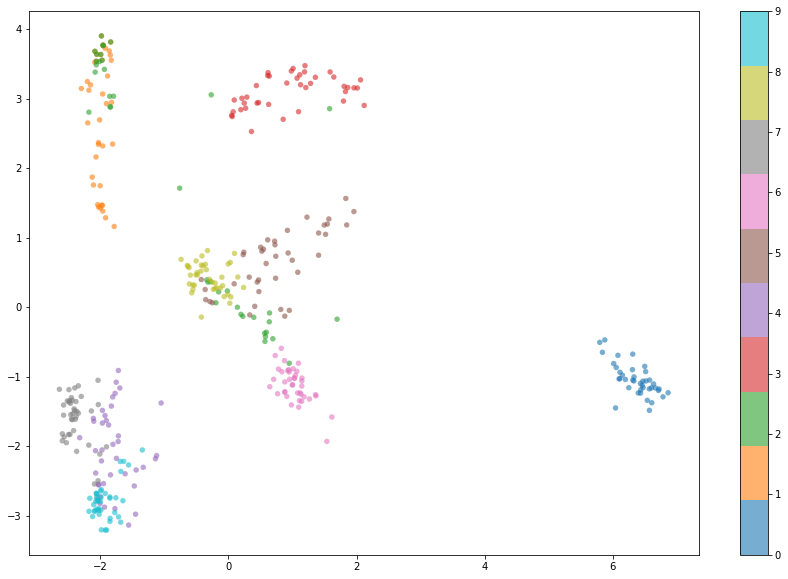

In [420]:

show_pca(topN_kernels_for_digit.reshape(10*40, 784), 
         np.concatenate([np.repeat(i, 40) for i in range(10)]),
         s=30, alpha=0.6)

## HP search

In [471]:

def benchmark_score(layer):
#     layer.freeze()
    mnist_train_embeddings = standard_scale(compute_embeddings(layer, mnist_train))
    mnist_test_embeddings = standard_scale(compute_embeddings(layer, mnist_test))
    score = logReg_score(mnist_train_embeddings, mnist_train_labels, mnist_test_embeddings, mnist_test_labels)
#     layer.unfreeze()
    return score


In [ ]:

EPOCHS = 3
NEURONS = [100,500,1000]
THRESHOLD_DECAYS=[.1,.05,.01,.005,.001,.0005,.0001,.00005,.00001]
WEIGHT_BOOSTS=[.5,.1,.05,.01,.005,.001,.0005,.0001]

DIMS = [28, 28]
BENCHMARK_INTERVAL = 10000

results = []
best_score = 0
best_res = None
best_W = None

for N in NEURONS:
    for TD in THRESHOLD_DECAYS:
        for WB in WEIGHT_BOOSTS:
            L = FastLayer(DIMS[0]*DIMS[1], N, TD, WB)

            print(f"HP:\t{N}\t{TD}\t{WB}")

            i=0
            for epoch in range(EPOCHS):

                print(f"Epoch {epoch}")
                indices = np.arange(mnist_train.shape[0])
                np.random.shuffle(indices)

                for input_idx in indices:

                    i+=1
                    features = mnist_train[input_idx].flatten()
                    out = L.forward(features)

                    if i % BENCHMARK_INTERVAL == 0:
                        score = benchmark_score(L)
                        #print(score)
                        results.append([N,TD,WB,i,score])
                        # print(f"iter #{i} \t score {score}")
                        if score > best_score:
                            print(f"NEW BEST SCORE:\t{score} (from {best_score})\titer {i}\tHP:\t{N}\t{TD}\t{WB}")
                            best_score = score
                            best_W = L.W
                            best_res = [N,TD,WB,i]
                            


HP:	100	0.1	0.5
Epoch 0
NEW BEST SCORE:	0.1135 (from 0)	iter 10000	HP:	100	0.1	0.5
Epoch 1
Epoch 2
HP:	100	0.1	0.1
Epoch 0
Epoch 1
Epoch 2
HP:	100	0.1	0.05
Epoch 0
Epoch 1
Epoch 2
HP:	100	0.1	0.01
Epoch 0
Epoch 1
Epoch 2
HP:	100	0.1	0.005
Epoch 0
NEW BEST SCORE:	0.6718 (from 0.1135)	iter 10000	HP:	100	0.1	0.005
Epoch 1
Epoch 2
HP:	100	0.1	0.001
Epoch 0
NEW BEST SCORE:	0.9046 (from 0.6718)	iter 10000	HP:	100	0.1	0.001
Epoch 1
Epoch 2
HP:	100	0.1	0.0005
Epoch 0
NEW BEST SCORE:	0.906 (from 0.9046)	iter 10000	HP:	100	0.1	0.0005
NEW BEST SCORE:	0.9074 (from 0.906)	iter 20000	HP:	100	0.1	0.0005
NEW BEST SCORE:	0.9094 (from 0.9074)	iter 30000	HP:	100	0.1	0.0005
Epoch 1
Epoch 2
HP:	100	0.1	0.0001
Epoch 0
Epoch 1
Epoch 2
HP:	100	0.05	0.5
Epoch 0
Epoch 1
Epoch 2
HP:	100	0.05	0.1
Epoch 0
Epoch 1
Epoch 2
HP:	100	0.05	0.05
Epoch 0
Epoch 1
Epoch 2
HP:	100	0.05	0.01
Epoch 0
Epoch 1
Epoch 2
HP:	100	0.05	0.005
Epoch 0
Epoch 1
Epoch 2
HP:	100	0.05	0.001
Epoch 0
Epoch 1
Epoch 2
HP:	100	0.05	0.0005
Epoch 

NEW BEST SCORE:	0.907 (from 0.2599)	iter 10000	HP:	1	100	0.1	0.001
NEW BEST SCORE:	0.9081 (from 0.907)	iter 20000	HP:	1	100	0.1	0.0005
NEW BEST SCORE:	0.9103 (from 0.9081)	iter 30000	HP:	1	100	0.1	0.0005

NEW BEST SCORE:	0.9263 (from 0.9251)	iter 80000	HP:	100	0.001	0.0005

NEW BEST SCORE:	0.9292 (from 0.9287)	iter 60000	HP:	100	0.0001	0.005

## Multi layer


----------------
Running frontprop on MNIST
Neurons' weights:


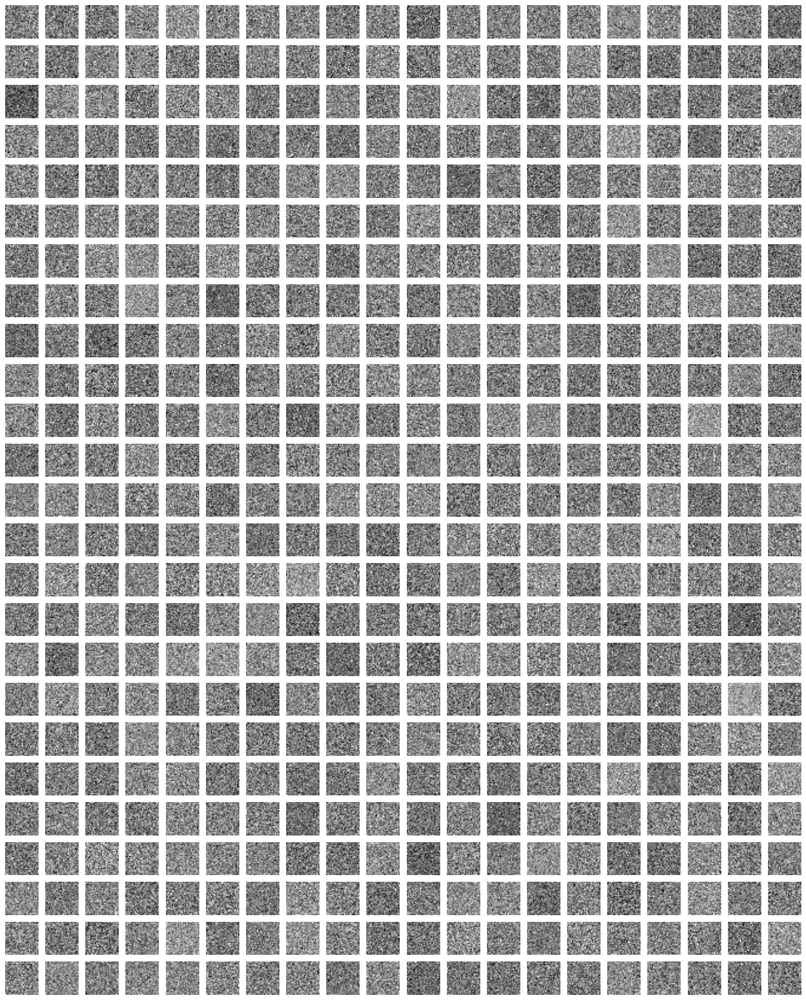

Neurons' weights:


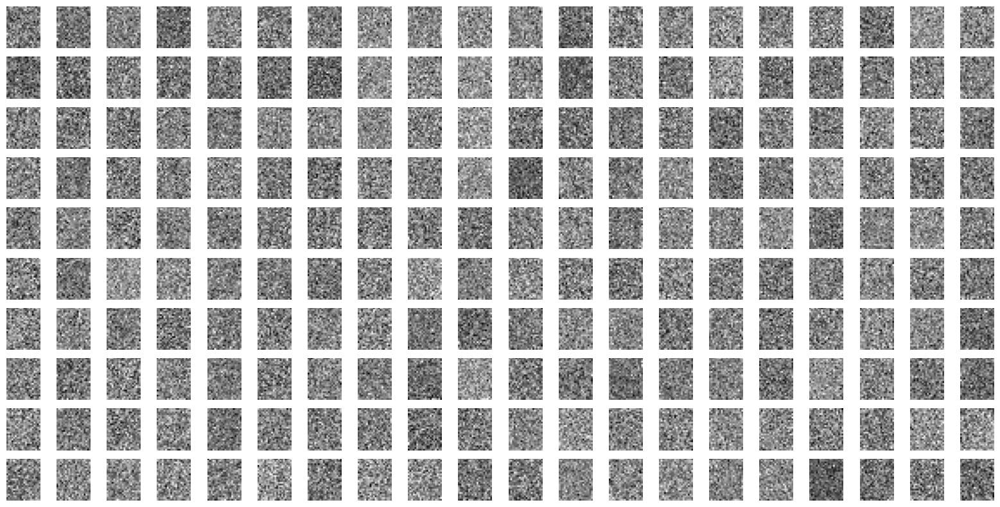

Neurons' weights:


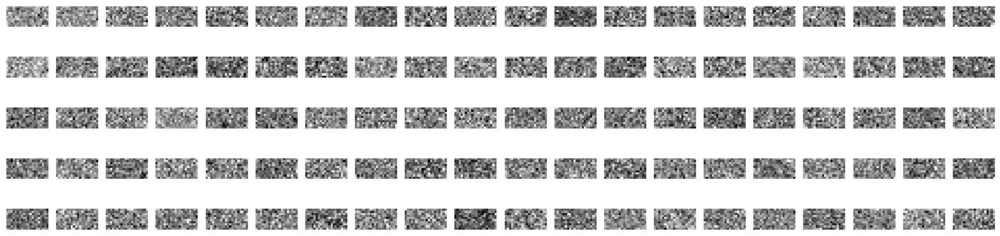

Training layer 1


  0%|          | 0/60000 [00:00<?, ?it/s]

Layer 1:
Neurons' weights:


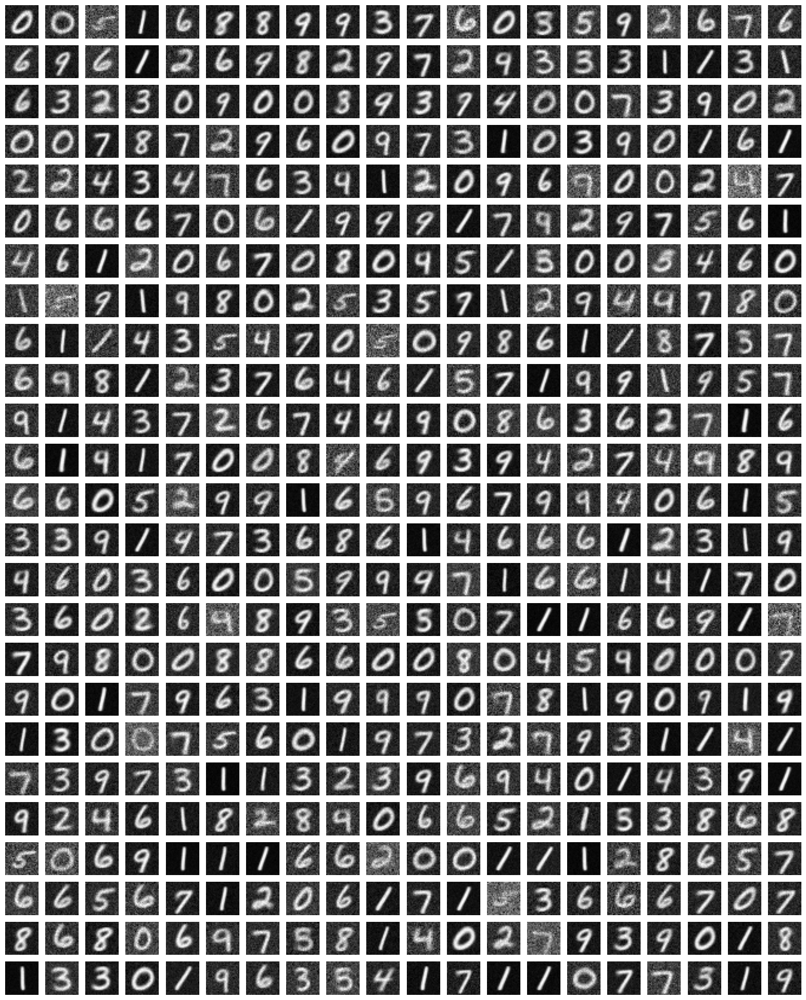

Freezing all 500 neurons
Training layer 2


  0%|          | 0/60000 [00:00<?, ?it/s]

Layer 2:
Neurons' weights:


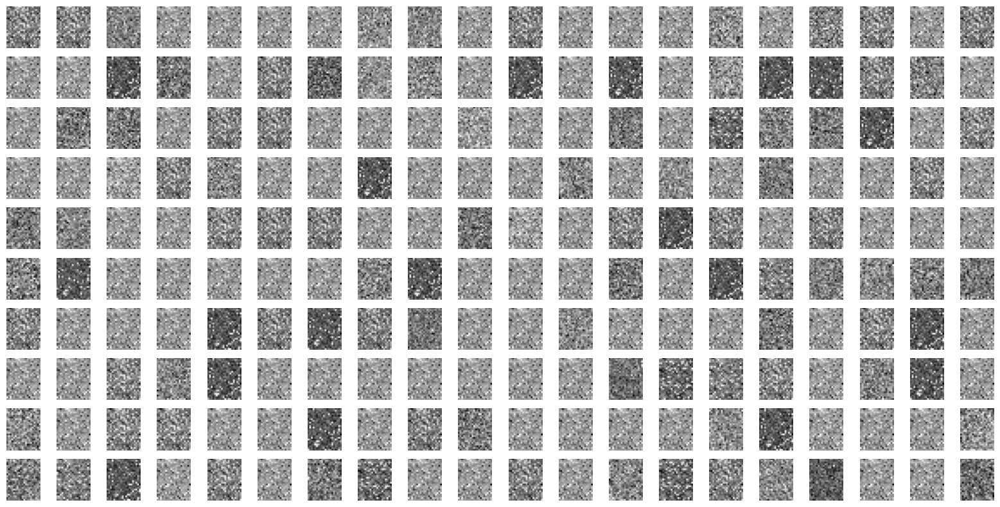

Freezing all 200 neurons
Training layer 3


  0%|          | 0/60000 [00:00<?, ?it/s]

In [37]:

L1_SIZE = 500
L2_SIZE = 200
L3_SIZE = 100

THRESHOLD_DECAY=0.0001
WEIGHT_BOOST=0.01

DIMS = [28, 28]

L1 = FastLayer(DIMS[0]*DIMS[1], L1_SIZE, THRESHOLD_DECAY, WEIGHT_BOOST)
L2 = FastLayer.After(L1, L2_SIZE, THRESHOLD_DECAY, WEIGHT_BOOST)
L3 = FastLayer.After(L2, L3_SIZE, THRESHOLD_DECAY, WEIGHT_BOOST)

# TODO
# stats = TrailingStats()

print("\n----------------\nRunning frontprop on MNIST")

L1.draw(DIMS)
L2.draw([int(L1_SIZE/20),20])
L3.draw([int(L2_SIZE/20),20])

indices = np.arange(mnist_train.shape[0])
np.random.shuffle(indices)

print("Training layer 1")
for i, input_idx in enumerate(tqdm(indices)):
    features = mnist_train[input_idx].flatten()
    output = L1.forward(features)

print("Layer 1:")
L1.draw(DIMS)
L1.freeze()

print("Training layer 2")
for i, input_idx in enumerate(tqdm(indices)):
    features = mnist_train[input_idx].flatten()
    out1 = L1.forward(features)
    out2 = L2.forward(out1)

print("Layer 2:")
L2.draw([int(L1_SIZE/20),20])
L2.freeze()

print("Training layer 3")
for i, input_idx in enumerate(tqdm(indices)):
    features = mnist_train[input_idx].flatten()
    out1 = L1.forward(features)
    out2 = L2.forward(out1)
    out3 = L3.forward(out2)

print("Layer 3:")
L3.draw([int(L2_SIZE/20),20])
L3.freeze()

In [ ]:
L1_train_embeddings = compute_embeddings(L1, mnist_train)
L2_train_embeddings = compute_embeddings(L2, L1_train_embeddings)
L3_train_embeddings = compute_embeddings(L3, L2_train_embeddings)

Freezing all 2000 neurons


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 60000/60000 [09:34<00:00, 104.50it/s]


Freezing all 1000 neurons


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 60000/60000 [12:16<00:00, 81.51it/s]


Freezing all 500 neurons


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 60000/60000 [01:34<00:00, 636.45it/s]


In [ ]:
L1_train_embeddings = standard_scale(L1_train_embeddings)
L2_train_embeddings = standard_scale(L2_train_embeddings)
L3_train_embeddings = standard_scale(L3_train_embeddings)

In [ ]:

L1_test_embeddings = compute_embeddings(L1, mnist_test)
L2_test_embeddings = compute_embeddings(L2, L1_test_embeddings)
L3_test_embeddings = compute_embeddings(L3, L2_test_embeddings)


Freezing all 2000 neurons


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [01:37<00:00, 102.16it/s]


Freezing all 1000 neurons


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [02:05<00:00, 79.72it/s]


Freezing all 500 neurons


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:12<00:00, 786.20it/s]


In [ ]:
L1_test_embeddings = standard_scale(L1_test_embeddings)
L2_test_embeddings = standard_scale(L2_test_embeddings)
L3_test_embeddings = standard_scale(L3_test_embeddings)

In [ ]:

L1_score = logReg_score(L1_train_embeddings, mnist_train_labels, L1_test_embeddings, mnist_test_labels)
L2_score = logReg_score(L2_train_embeddings, mnist_train_labels, L2_test_embeddings, mnist_test_labels)
L3_score = logReg_score(L3_train_embeddings, mnist_train_labels, L3_test_embeddings, mnist_test_labels)


In [ ]:
print(L1_score, L2_score, L3_score)

In [452]:
print(L1_score, L2_score, L3_score)

0.9643 0.929 0.847


500/100/50: ```0.9488 0.8881 0.7563```

In [453]:

# combined score
combined_train_embeddings = np.hstack((L1_train_embeddings, L2_train_embeddings, L3_train_embeddings))
combined_test_embeddings = np.hstack((L1_test_embeddings, L2_test_embeddings, L3_test_embeddings))

all_layers_score = logReg_score(combined_train_embeddings, mnist_train_labels, 
                                combined_test_embeddings, mnist_test_labels)

In [454]:
print(all_layers_score)

0.9655


500/100/50: ```0.9515```

In [48]:
from torch import nn, optim
from torchvision import datasets, transforms
from torch.utils.data import DataLoader

# Define a transform to normalize the data
transform = transforms.Compose([transforms.ToTensor(),
                                transforms.Normalize((0.5,), (0.5,))])

trainset = datasets.MNIST(root='./data', download=True, train=True, transform=transform)

In [62]:
trainloader = DataLoader(trainset, batch_size=32, shuffle=True)

model = nn.Sequential(
    # nn.Linear(784, 50), #, bias=False),
    
    nn.Conv2d(1, 10, kernel_size=5),
    nn.MaxPool2d(2),

    nn.ReLU(),
    nn.Flatten(),

    nn.Linear(1440, 10), #, bias=False),
    nn.Softmax(dim=1))

criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.01)

epochs = 5
for e in range(epochs):
    running_loss = 0
    for images, labels in trainloader:

        # For Linear: 
        # Flatten MNIST images into a 784 long vector
        # images = images.view(images.shape[0], -1)

        # For Conv:
        # Add an extra dimension for the channel
        # images = images.unsqueeze(1)
    
        # Training pass
        optimizer.zero_grad()
        
        output = model(images)
        loss = criterion(output, labels)
        
        # Backpropagation
        loss.backward()
        
        # Weight update
        optimizer.step()
        
        running_loss += loss.item()
    else:
        print(f"Training loss: {running_loss/len(trainloader)}")

Training loss: 1.850942005221049
Training loss: 1.7121341881434122
Training loss: 1.701155071512858
Training loss: 1.695134949239095
Training loss: 1.6904800666173299


In [66]:
# Download and load the test data
testset = datasets.MNIST('./data', download=True, train=False, transform=transform)
testloader = DataLoader(testset, batch_size=64, shuffle=True)

correct_count, all_count = 0, 0
for images,labels in testloader:
    for i in range(len(labels)):

        img = images[i].unsqueeze(1) # .view(1, 784)

        with torch.no_grad():
                ps = model(img)

        probab = list(ps.numpy()[0])
        pred_label = probab.index(max(probab))
        true_label = labels.numpy()[i]
        if(true_label == pred_label):
            correct_count += 1
        all_count += 1

print("Number Of Images Tested =", all_count)
print("\nModel Accuracy =", (correct_count/all_count))

Number Of Images Tested = 10000

Model Accuracy = 0.7764


In [73]:

weight_matrices = [model[0].weight.data[i].squeeze() for i in range(len(model[0].weight.data))]

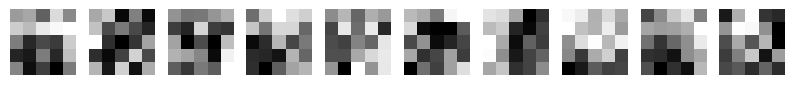

In [74]:
plot_matrix([5,5], *weight_matrices)

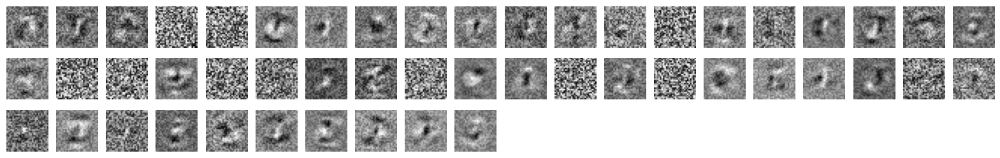

In [56]:
plot_matrix([28,28], *weight_matrices)

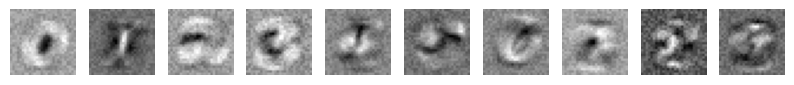

In [25]:
plot_matrix([28,28], *weight_matrices)